# Purpose

Show how the voltage on a transmission line evolves toward steady state for the case of a switched DC source. Illustrate with matplotlib animations for a variety of cases.

# Contents

- [Definitions](#definitions)
- [Example 1 - $Z_L, Z_g > Z_0$](#example1)
- [Example 2 - $Z_L > Z_0$ and $Z_g < Z_0$](#example2)
- [Example 3 - $Z_L < Z_0$ and $Z_g < Z_0$](#example3)
- [Example 4 - Impedance matched source](#example4)
- [Example 5 - Impedance matched load](#example5)

# Definitions <a id='definitions'></a>

Reflection coefficients:
\begin{aligned} \Gamma_L &= \frac{R_L - Z_0}{R_L + Z_0}\\
\Gamma_g &= \frac{R_g - Z_0}{R_g + Z_0}
\end{aligned}

Voltages:
\begin{aligned} v_1^+ &= v_g\frac{Z_0}{Z_0 + R_g}\\
v_1^- &= \Gamma_L v_1^+\\
v_2^+ &= \Gamma_g v_1^- = \Gamma_g \Gamma_L v_1^+\\
v_2^- &= \Gamma_L v_2^+ = \Gamma_L \Gamma_g \Gamma_L v_1^+\\
v_3^+ &= \Gamma_g v_2^- = \Gamma_g \Gamma_L \Gamma_g \Gamma_L v_1^+\\
v_3^- &= \Gamma_L v_3^+ = \Gamma_L \Gamma_g \Gamma_L \Gamma_g \Gamma_L v_1^+\\
&\vdots
\end{aligned}

Steady state voltage:
\begin{aligned} v_{ss} &= v_1^+ + v_1^- + v_2^+ + v_2^- + v_3^+ + v_3^- + ...\\
&= v_g \frac{R_L}{R_g + R_L}\\
\end{aligned}

Time to propagate from one end of the transmission line to the other end:
$$T = \frac{l_{tline}}{u}$$

where $l_{tline}$ is the length of the transmission line and $u$ is the phase velocity.

# Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import animation
from JSAnimation import IPython_display

# Define functions used to create t-line animations

In [2]:
# Function to set up array with v1+, v1-, v2+, v2-, etc.
def calc_delta_voltages(nbounces, v1_plus, loadreflcoeff, genreflcoeff):
    delta_voltages = np.zeros(nbounces)
    delta_voltages[0] = v1_plus
    for i in range(1,nbounces):
        if i%2 == 0:
            delta_voltages[i] = delta_voltages[i-1] * genreflcoeff
        else:
            delta_voltages[i] = delta_voltages[i-1] * loadreflcoeff
    return delta_voltages

# Function to calculate voltage along t-line for a given normalized voltage, t_normalized = t/T
def calc_voltage_on_tline(t_normalized,v,reflcoeff_load,reflcoeff_gen,delta_voltages):
    nbounces, fractalongtline = divmod(t_normalized,1)
    nbounces = int(nbounces)
    numpnts_in_plot = len(v)
    basevoltage = 0.0
    if nbounces != 0:
        for i in range(nbounces):
            basevoltage += delta_voltages[i]
    v[:] = basevoltage
    next_increment = delta_voltages[nbounces]
    if nbounces % 2 == 0:
        index = round(fractalongtline*numpnts_in_plot)
        v[:index] += next_increment
    else:
        index = round((1.0 - fractalongtline)*numpnts_in_plot)
        v[index:] += next_increment
    return v

def make_tline_animation():
    # Calculate reflection coefficients & voltages
    loadreflcoeff = (Z_L - Z_0)/(Z_L + Z_0)
    genreflcoeff = (Z_g - Z_0)/(Z_g + Z_0)
    v1_plus = v_g * Z_0 / (Z_g + Z_0)
    v_steadystate = v_g * float(Z_L) / (Z_L + Z_g)

    # Set up more animation & plot parameters
    numframes = nbounces * T_numframes + 1
    zmin = 0.0
    zmax = tline_length
    u = float(zmax - zmin)/numframes
    plotfontsize = 14

    # Set up array for linear sampling along z-axis & array for voltages at those points
    z = np.linspace(zmin,zmax,num=numpnts_in_plot)
    v = np.zeros(numpnts_in_plot)
    delta_voltages = calc_delta_voltages(nbounces+1, v1_plus, loadreflcoeff, genreflcoeff)

    # Create text strings for labels
    text1 = '$v_g$ = %.3f V\n' % v_g
    text1 += '$Z_0$ = %.1f $\Omega$\n' % Z_0
    text1 += '$Z_L$ = %.1f $\Omega$\n' % Z_L
    text1 += '$Z_g$ = %.1f $\Omega$' % Z_g
    text2 = '$v_{steadystate}$ = %.3f V\n' % v_steadystate
    text2 += '$\Gamma_L$ = %.3f\n' % loadreflcoeff
    text2 += '$\Gamma_g$ = %.3f' % genreflcoeff
    subscript_index = 1
    text3 = '$v_{%d}^+$ = %.5f V\n' % (subscript_index, delta_voltages[0])
    for i in range(1,nbounces):
        if i%2 == 0:
            subscript_index += 1
            text3 += '$v_{%d}^+$ = %.5f V\n' % (subscript_index, delta_voltages[i])
        else:
            text3 += '$v_{%d}^-$ = %.5f V\n' % (subscript_index, delta_voltages[i])

    # Set up the figure, axis, and plot elements we want to animate
    fig = plt.figure(figsize=(10,6))
    ax = plt.axes([0.1, 0.1, 0.7, 0.9], xlim=(zmin, zmax), ylim=(0,2.2*v_g))
    ax.set_xlabel('z (m)', fontsize=plotfontsize)
    ax.set_ylabel('Voltage (V)', fontsize=plotfontsize)
    ax.text(0.1, 0.75, text1, transform = ax.transAxes, fontsize=plotfontsize)
    ax.text(0.6, 0.75, text2, transform = ax.transAxes, fontsize=plotfontsize)
    line, = ax.plot([], [], lw=2)
    textfortime = ax.text(0.1, 0.15, '', transform = ax.transAxes, fontsize=plotfontsize)
    ax.text(1.05, 0.95, text3, verticalalignment='top', transform=ax.transAxes, fontsize=plotfontsize)

    # initialization function: plot the background of each frame
    def init():
        line.set_data([], [])
        textfortime.set_text('')
        return line, textfortime,

    # animation function.  This is called sequentially
    def plot_v(t):
        t_normalized = float(t)/T_numframes
        tempv = calc_voltage_on_tline(t_normalized, v, loadreflcoeff, genreflcoeff, delta_voltages)
        line.set_data(z,tempv)
        text4 = 't = %.2f T' % t_normalized
        textfortime.set_text(text4)
        return line, textfortime,
    
    # Create animation and return it
    return animation.FuncAnimation(fig, plot_v, init_func=init, frames=numframes, interval=20, blit=True)

# Example 1:  $Z_L, Z_g > Z_0$ <a id='example1'></a>


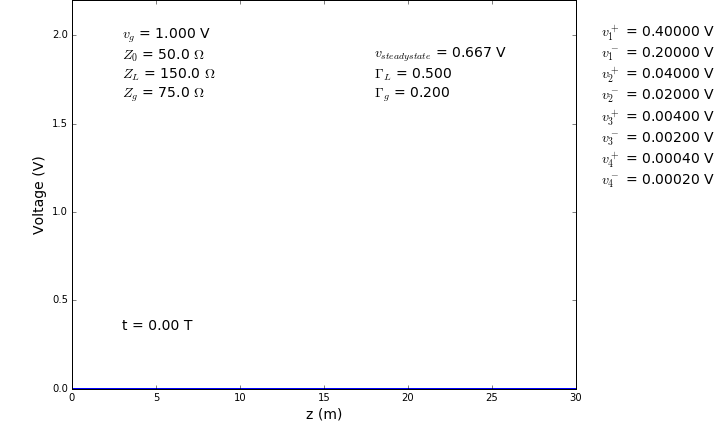
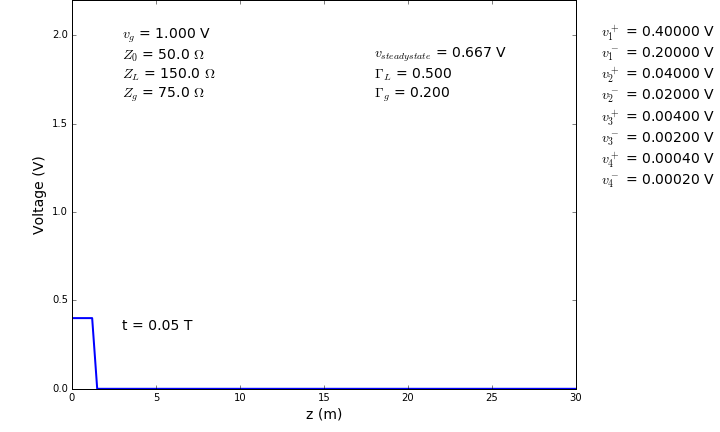
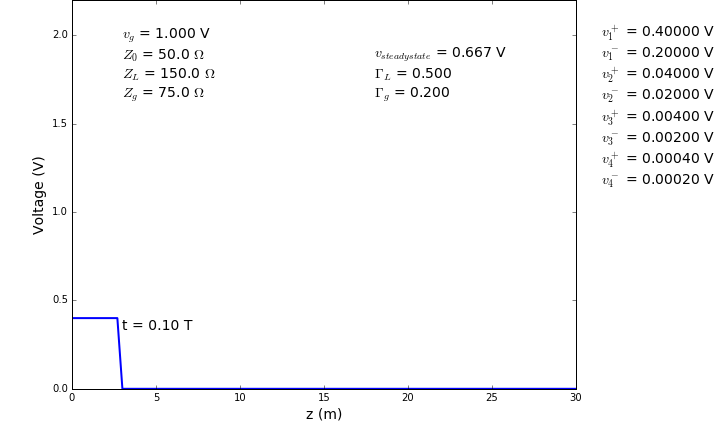
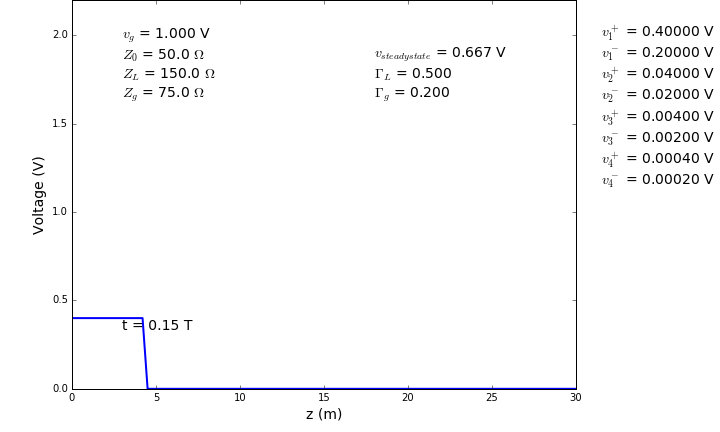
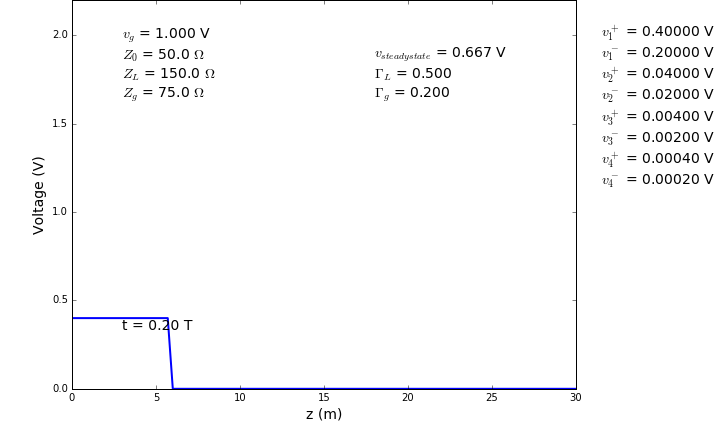
...
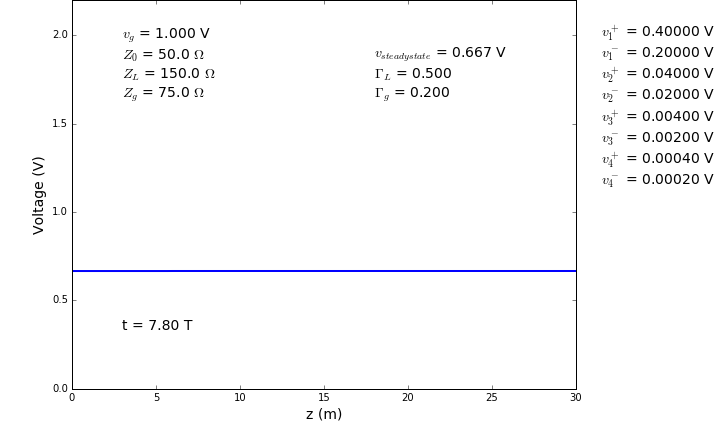
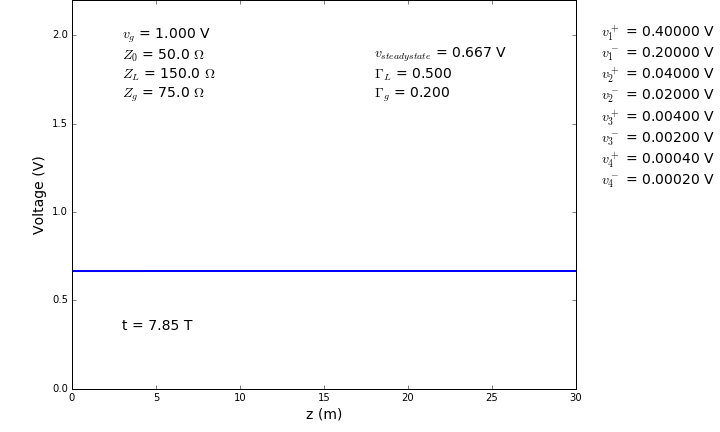
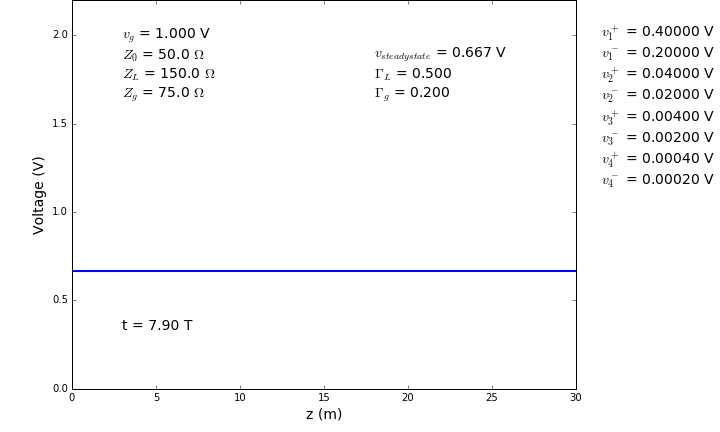
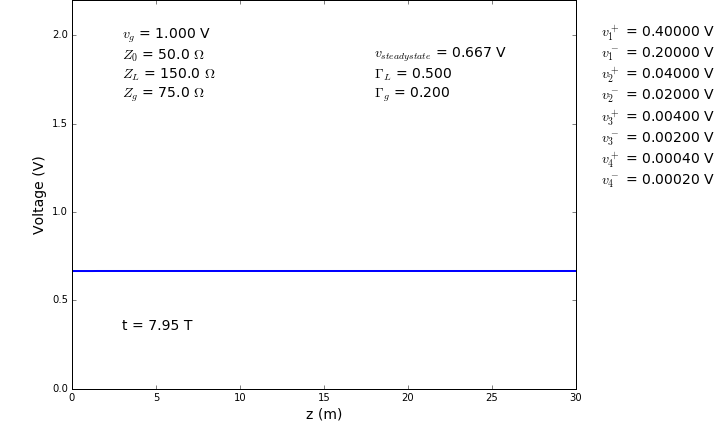
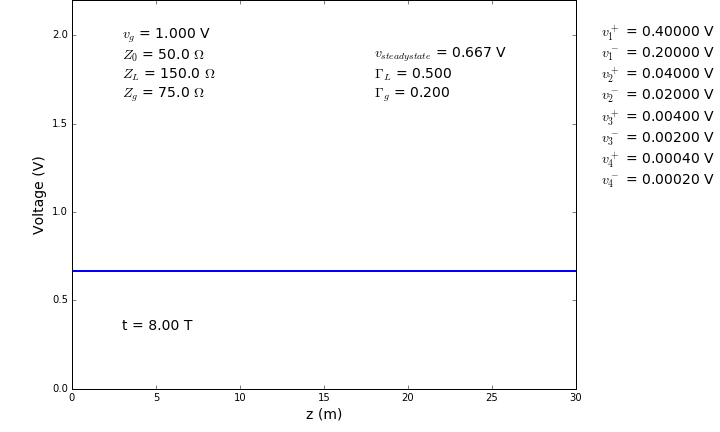

In [3]:
# Set basic t-line parameters
v_g = 1.0
Z_0 = 50.0
Z_L = 150.0
Z_g = 75.0
tline_length = 30.0

# Set several animation parameters & number of points in plot
nbounces = 8         # number of bounces to run simulation
T_numframes = 20     # number of frames to propagate from one end of t-line to other
numpnts_in_plot = 101 # number of points in plot

ani = make_tline_animation()
ani

# Example 2: $Z_L > Z_0$ and $Z_g < Z_0$ <a id='example2'></a>


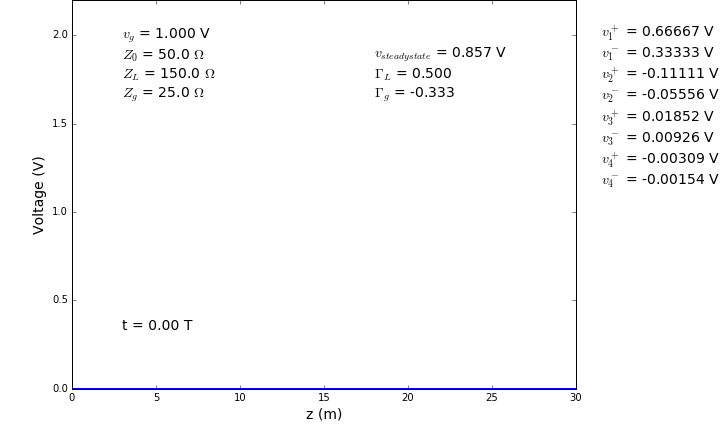
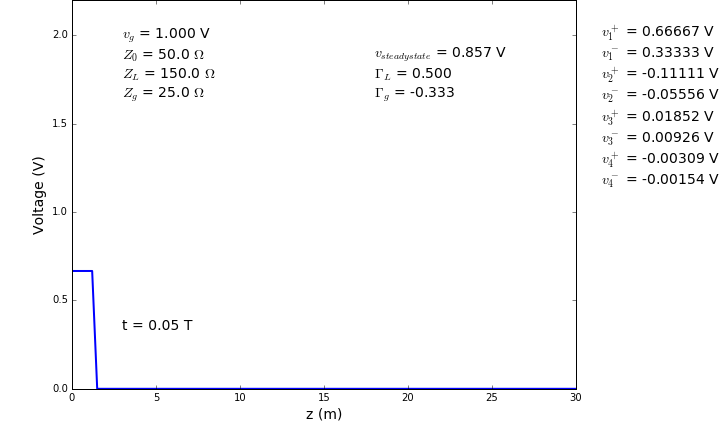
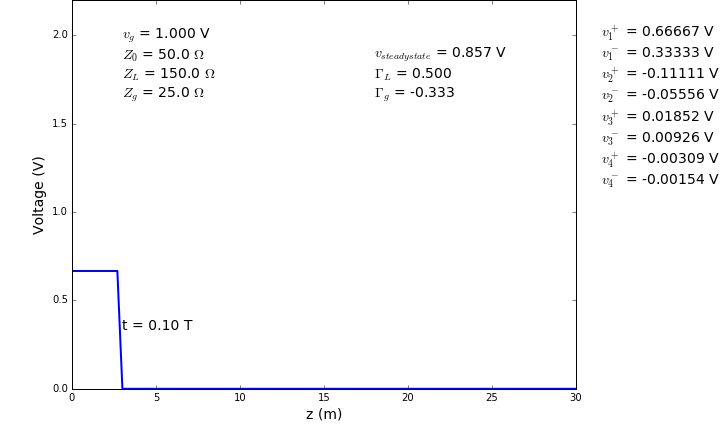
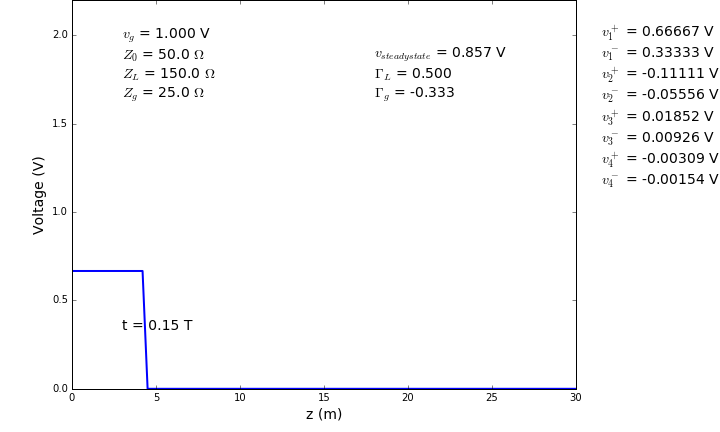
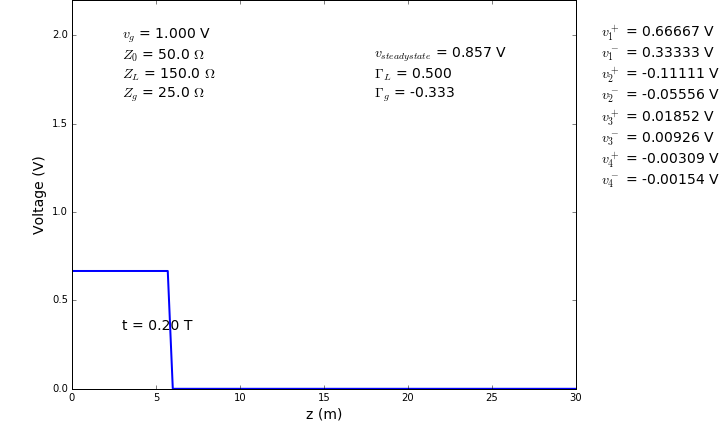
...
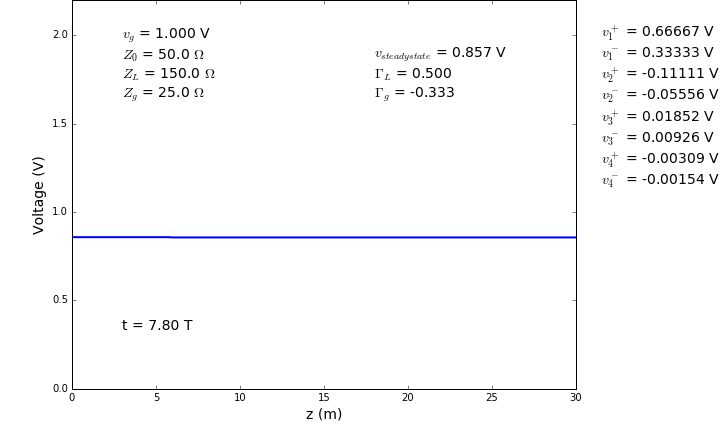
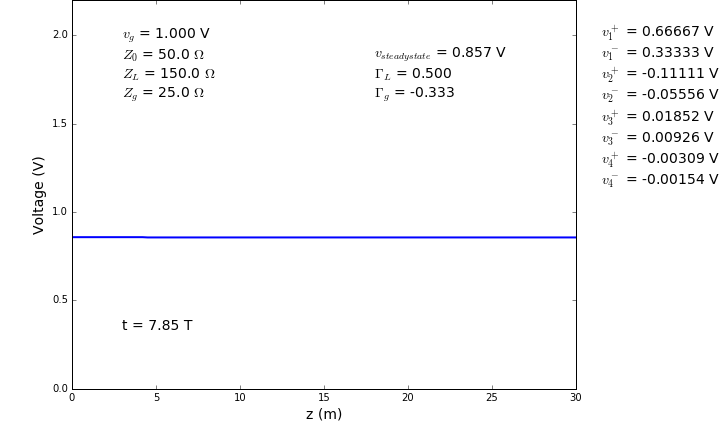
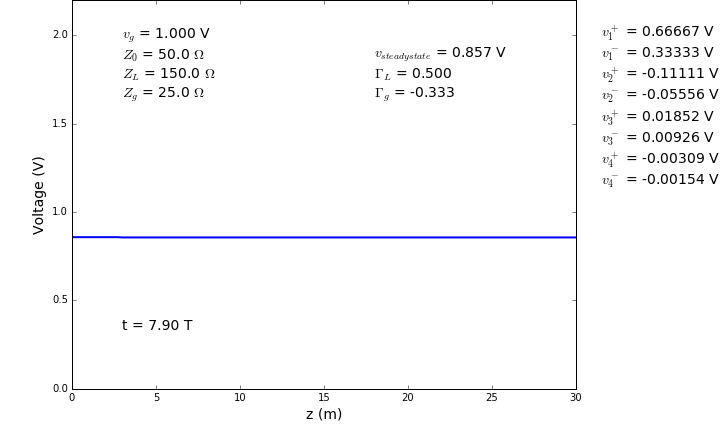
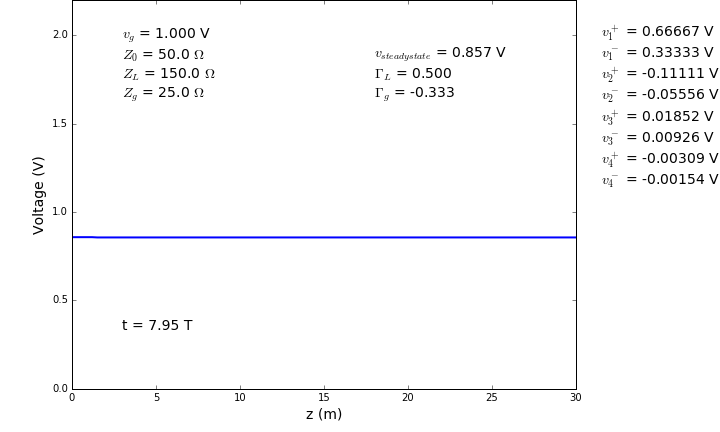
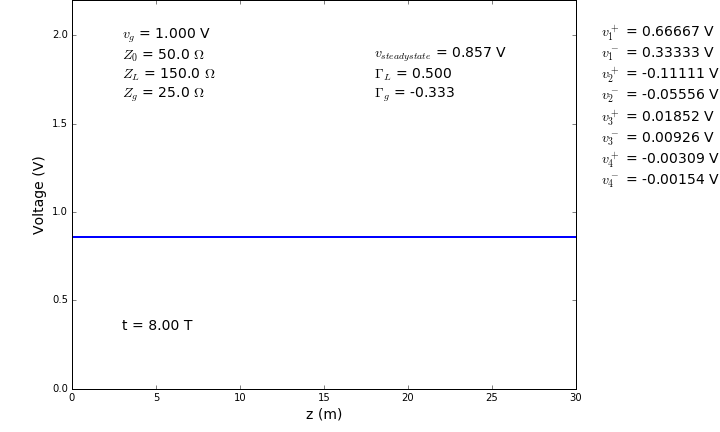

In [4]:
# Set basic t-line parameters
v_g = 1.0
Z_0 = 50.0
Z_L = 150.0
Z_g = 25.0
tline_length = 30.0

# Set several animation parameters & number of points in plot
nbounces = 8         # number of bounces to run simulation
T_numframes = 20     # number of frames to propagate from one end of t-line to other
numpnts_in_plot = 101 # number of points in plot

ani = make_tline_animation()
ani

# Example 3: $Z_L < Z_0$ and $Z_g < Z_0$ <a id='example3'></a>


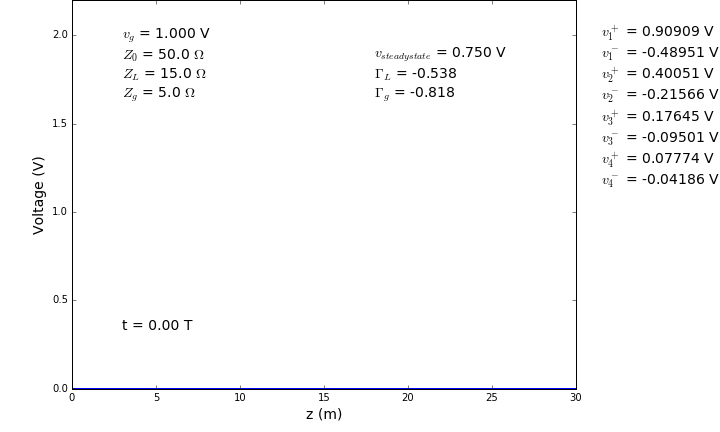
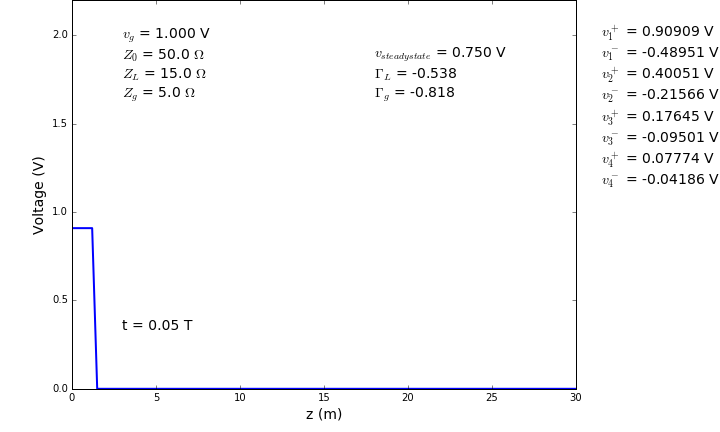
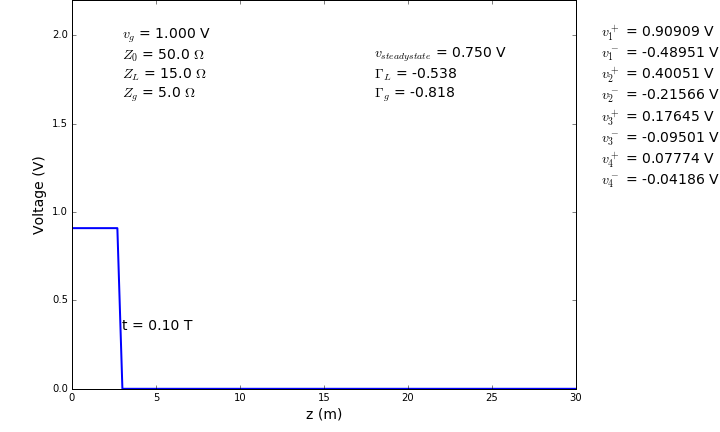
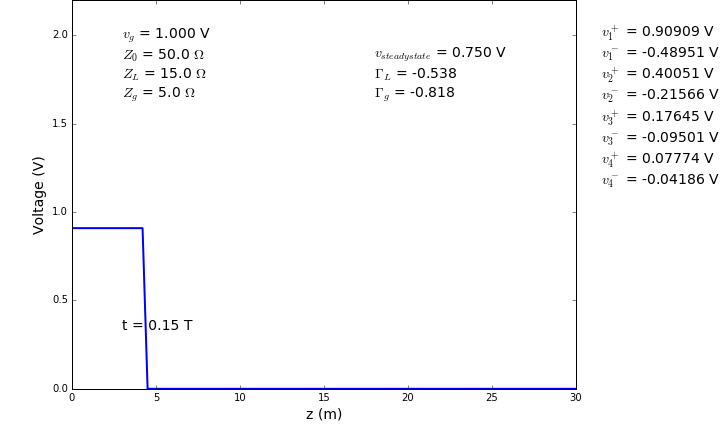
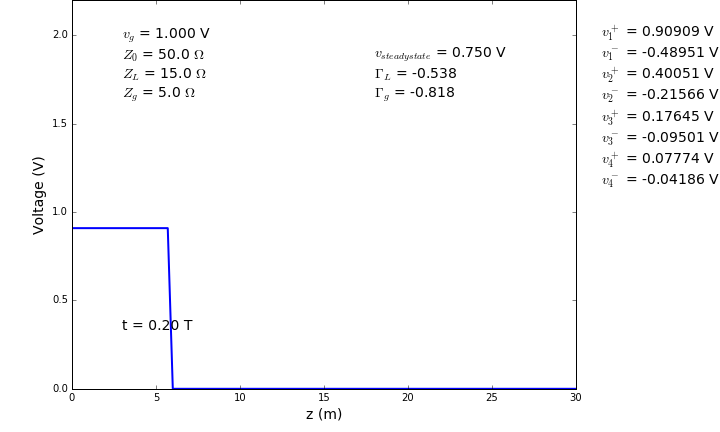
...
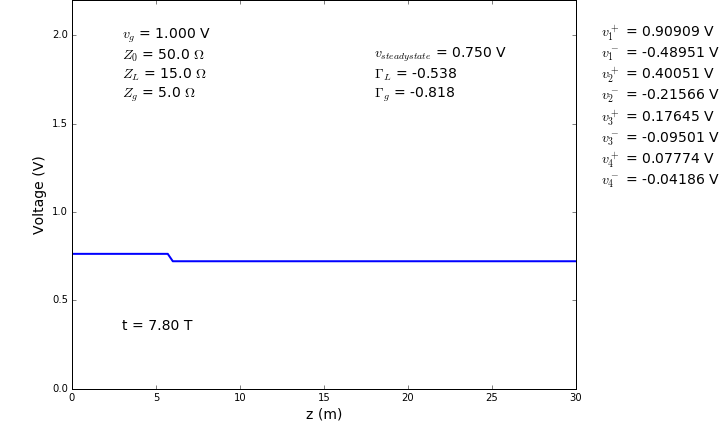
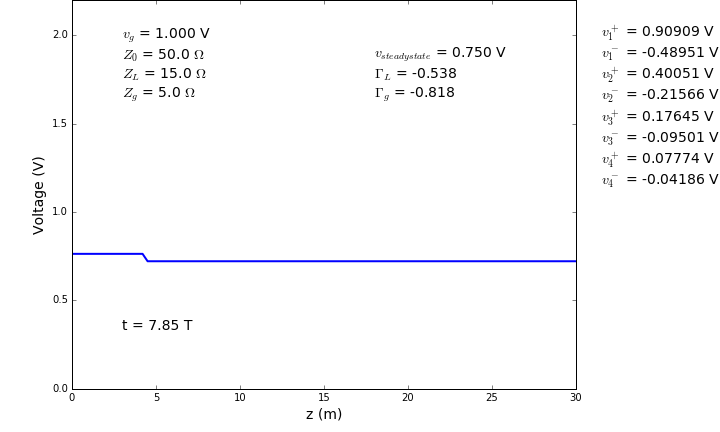
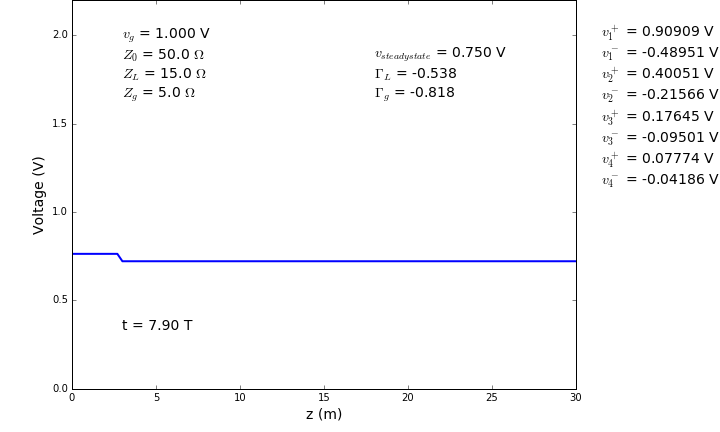
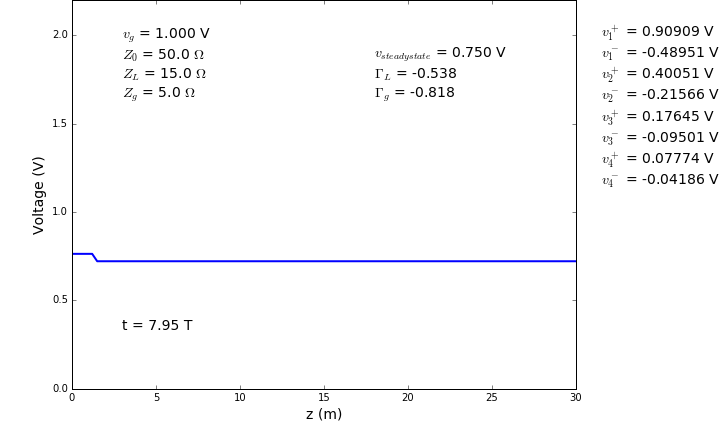
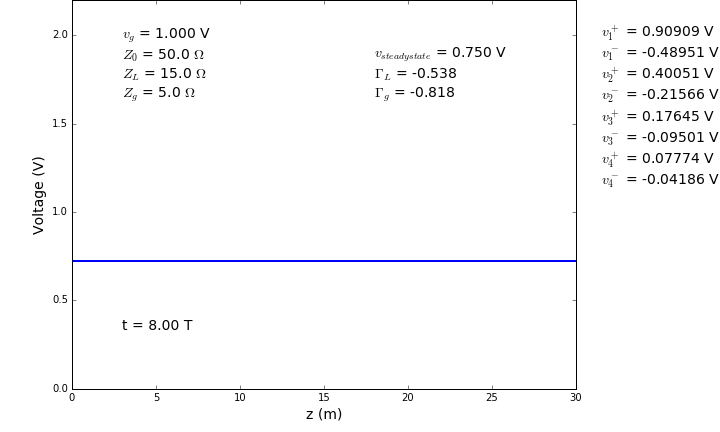

In [5]:
# Set basic t-line parameters
v_g = 1.0
Z_0 = 50.0
Z_L = 15.0
Z_g = 5.0
tline_length = 30.0

# Set several animation parameters & number of points in plot
nbounces = 8         # number of bounces to run simulation
T_numframes = 20     # number of frames to propagate from one end of t-line to other
numpnts_in_plot = 101 # number of points in plot

ani = make_tline_animation()
ani

# Example 4 - Impedance matched source <a id='example4'></a>


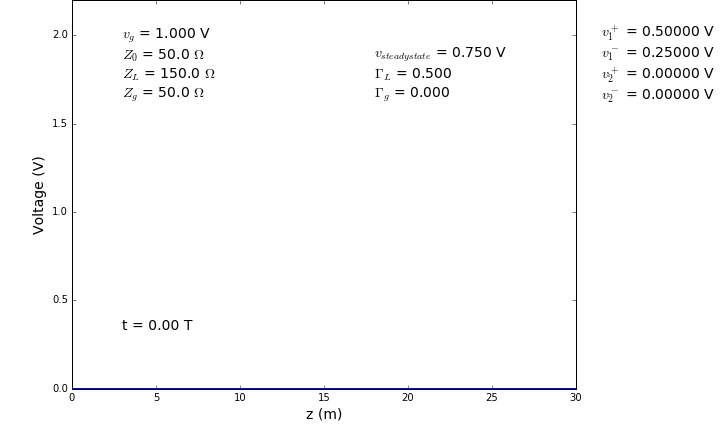
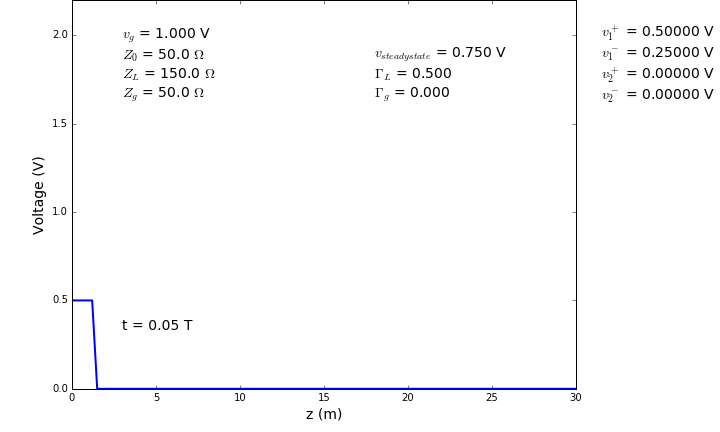
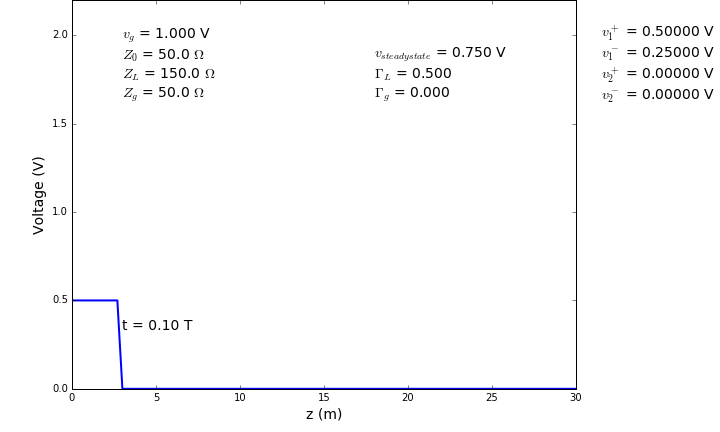
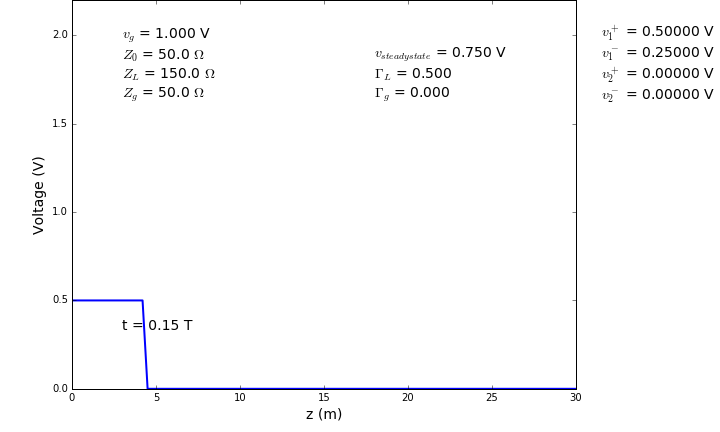
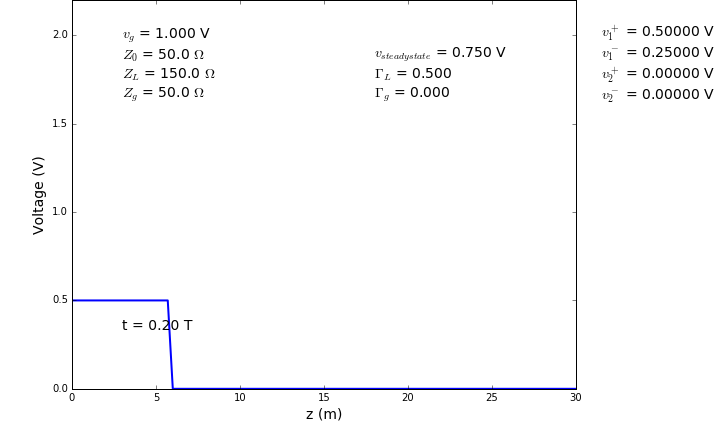
...
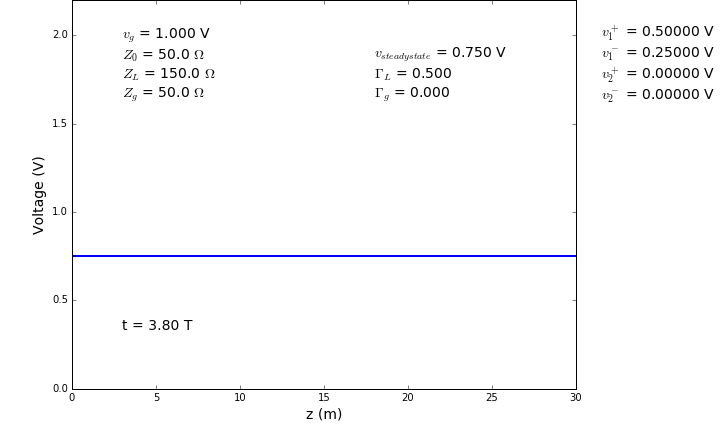
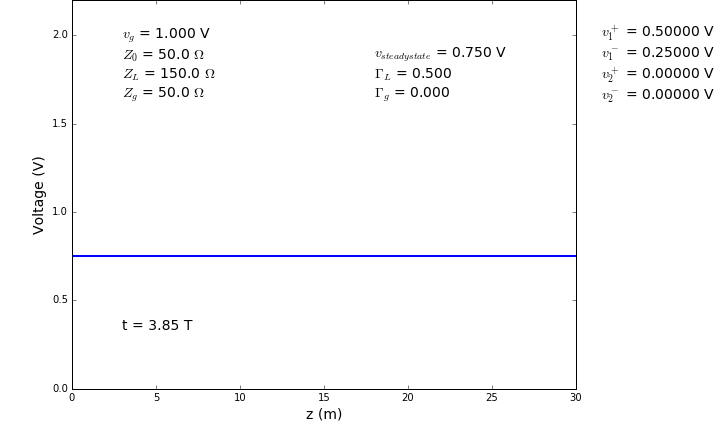
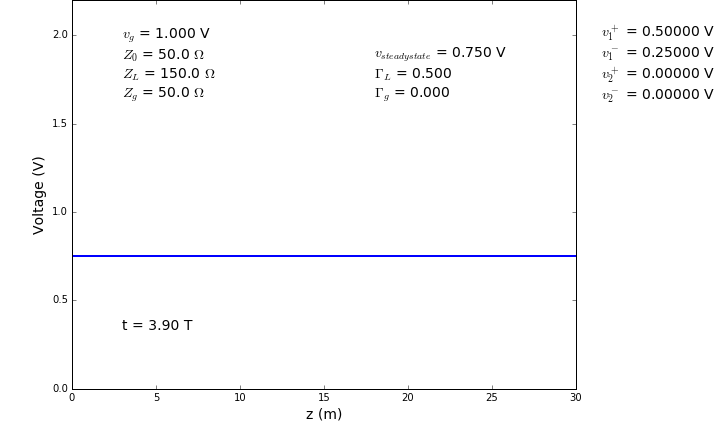
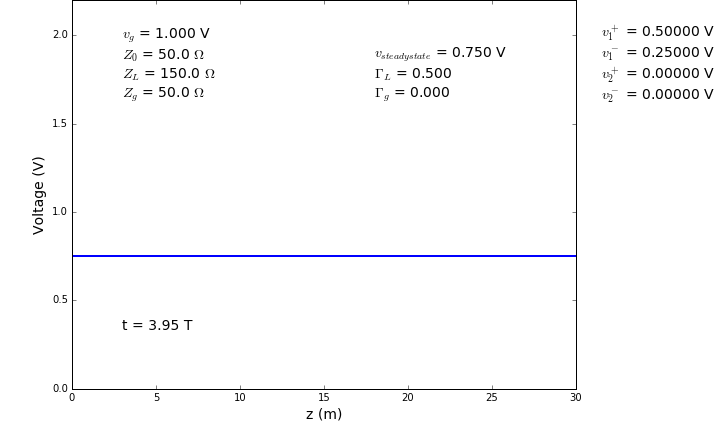
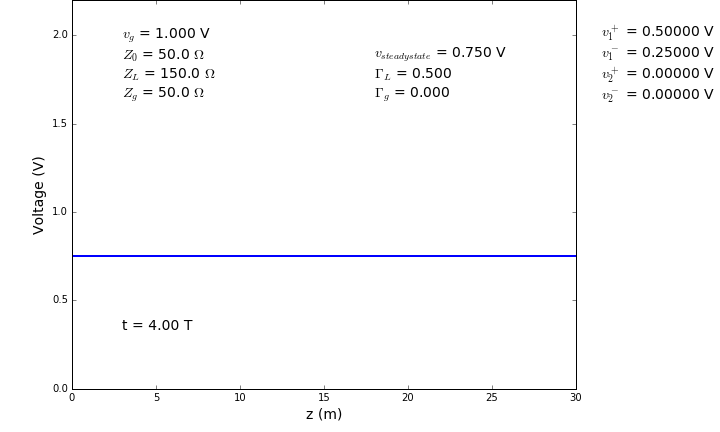

In [6]:
# Set basic t-line parameters
v_g = 1.0
Z_0 = 50.0
Z_L = 150.0
Z_g = 50.0
tline_length = 30.0

# Set several animation parameters & number of points in plot
nbounces = 4         # number of bounces to run simulation
T_numframes = 20     # number of frames to propagate from one end of t-line to other
numpnts_in_plot = 101 # number of points in plot

ani = make_tline_animation()
ani

# Example 5 - Impedance matched load <a id='example5'></a>


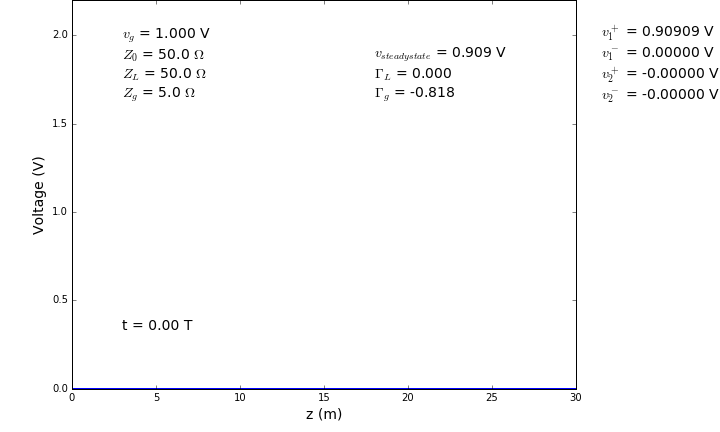
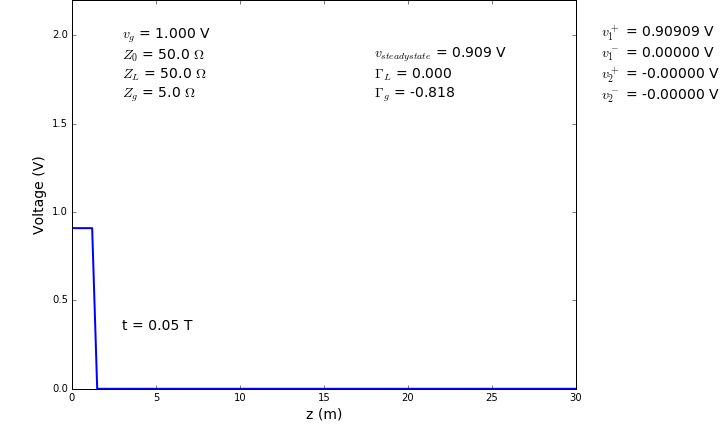
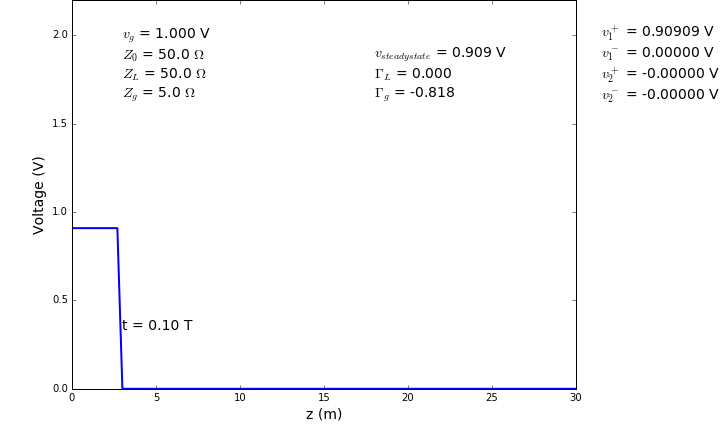
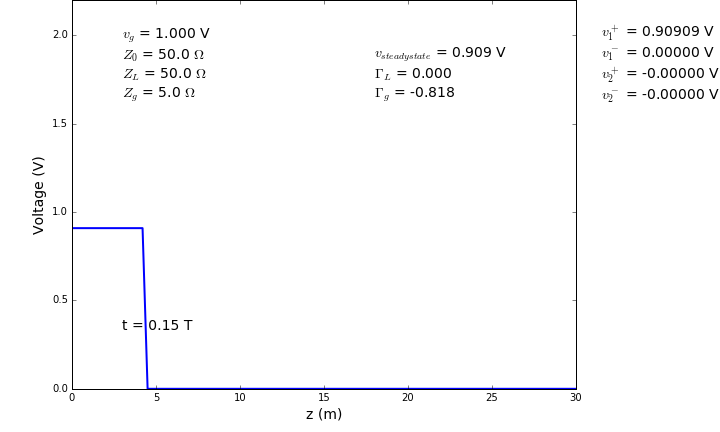
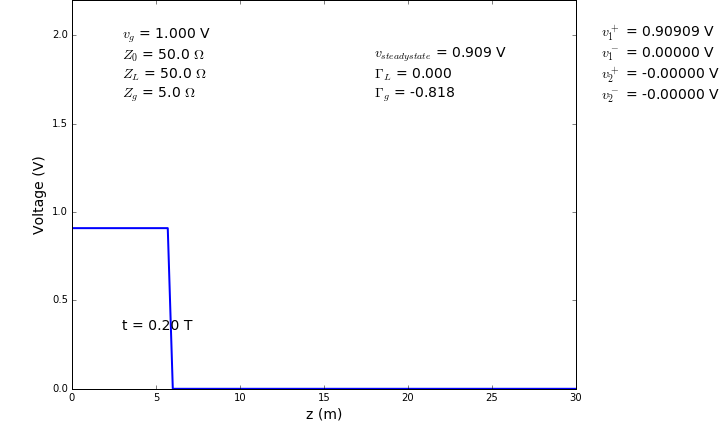
...
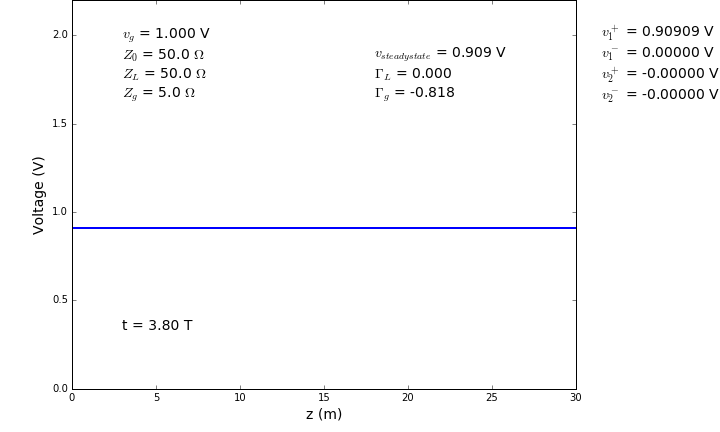
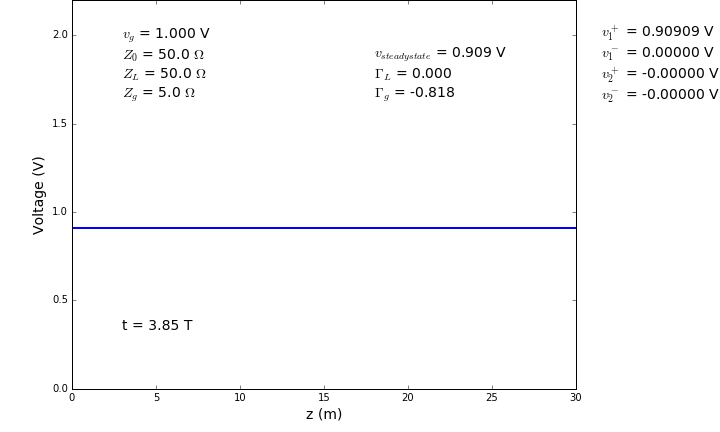
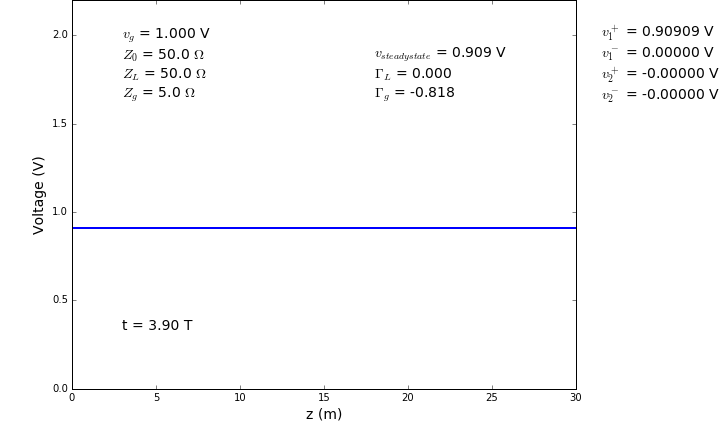
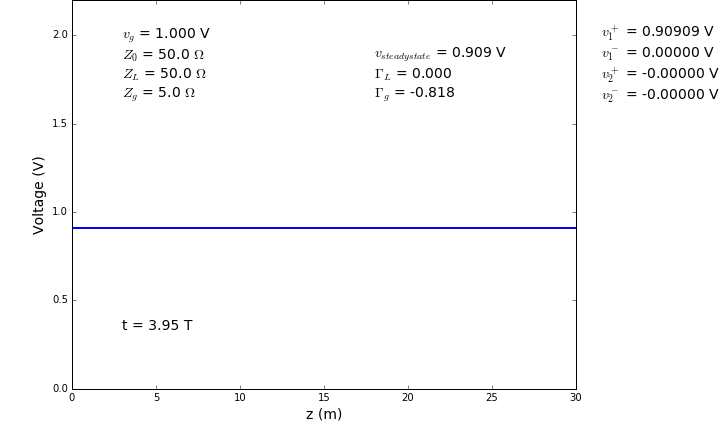
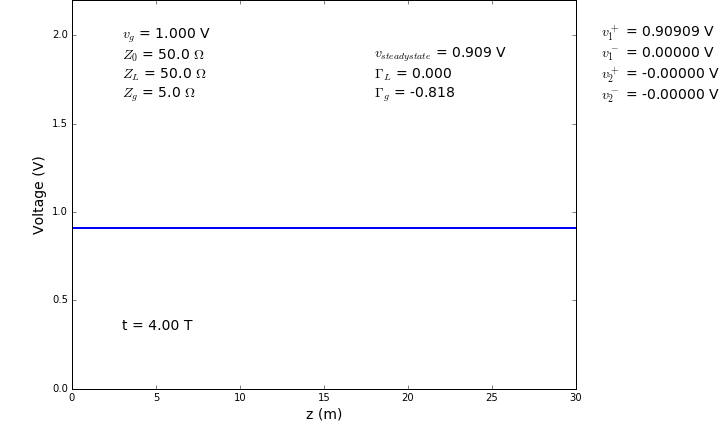

In [7]:
# Set basic t-line parameters
v_g = 1.0
Z_0 = 50.0
Z_L = 50.0
Z_g = 5.0
tline_length = 30.0

# Set several animation parameters & number of points in plot
nbounces = 4         # number of bounces to run simulation
T_numframes = 20     # number of frames to propagate from one end of t-line to other
numpnts_in_plot = 101 # number of points in plot

ani = make_tline_animation()
ani

**To Do**
1. DONE 2/6/15 - Make text bigger in plot (labels & annotations)
2. DONE 2/6/15 - Display v1+, v1-, etc. to right of each animation graph
3. Put t-line schematic diagram at top of notebook 
4. DONE 2/7/15 - Also put equations for reflection coefficients, T, v1+, v1-, etc. and v_steadystate at top of notebook. Include equivalent circuit figures for t=0 and t = $\infty$?
4. DONE 2/6/15 - Consolidate animation creation in a single function & call it with different v_g, Z_0, etc. parameters?
5. DONE 2/6/15 - Fix use of global variables?
6. Add bounce diagrams
7. Add a case for $Z_L < Z_0$ and $Z_g > Z_0$